## Notebook and Environment Setup

Here we include the required code blocks for setting up this notebook for this study.

In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'svg' # note - requires Inkscape to be installed, and to be accessible from the terminal
# on macos, add inkscape to the path with `sudo ln -s /Applications/Inkscape.app/Contents/MacOS/inkscape /usr/local/bin/inkscape`
%matplotlib inline

We will be using the Spectral Parameters Toolkit. First we import the required modules.

In [2]:
import sptk.config as cfg
from sptk.material_collection import MaterialCollection
from sptk.instrument import Instrument
from sptk.observation import Observation
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

We set our simulation resolution range to extend the range of Enfys, of 0.9 - 2.5 µm, such that the long tails of the Cauchy distribution of the linear-variable-filter profiles can be accommodated during sampling. We leave our spectral resolution at 1 nm for all $\lambda$.

In [3]:
cfg.update_sample_res('wvl_min', 800)
cfg.update_sample_res('wvl_max', 2600)

Finally we set the project name.

In [4]:
PROJECT_NAME = 'enfys_mrs_analysis_demo'

# Data

In [5]:
library = 'EXM_MRS'

In [6]:
EXM_MRS_LIB = {'standards': [('Standard', '*'), ('Standard_retest', '*')],
 'samples': [('4_Watchet_Bay', '*'),
  ('7_Oxia_Teresa', '*'),
  ('3_Sabtha', '*'),
  ('10_Otago', '*'),
  ('2_Atacama_Red', '*'),
  ('9_Congo', '*'),
  ('11_Iceland', '*'),
  ('6_Hydrothermal_Clay', '*'),
  ('15_Oxia_Sophia', '*'),
  ('5_Granby', '*'),
  ('8_Mudstone', '*')]}

## Material Collection Construction

We use the ```sptk.material_collection``` module to parse the spectral library:

In [7]:
matcol = MaterialCollection(
        EXM_MRS_LIB,
        'EXM_MRS', 
        PROJECT_NAME, 
        load_existing=False,
        balance_classes=False,
        random_bias_seed=None,
        allow_out_of_bounds=True,
        extrapolate=True,
        plot_profiles=False,
        export_df=True)

Building new enfys_mrs_analysis_demo MaterialCollection DF

---------------------------------
Category
└──species|subgroup|group|
   └──data_id status
---------------------------------
Standards
└──-Standard|Standard|Standard|
   └──-Standard_00001.csv loaded
   └──-Standard_00002.csv loaded
   └──-Standard_00003.csv loaded
└──-Standard_retest|Standard_retest|Standard_retest|
   └──-Standard_retest_00001.csv loaded
   └──-Standard_retest_00002.csv loaded
   └──-Standard_retest_00003.csv loaded
---------------------------------
Samples
└──-10_Otago|10_Otago|10_Otago|
   └──-10_Otago_00001.csv loaded
   └──-10_Otago_00002.csv loaded
   └──-10_Otago_00003.csv loaded
   └──-10_Otago_00004.csv loaded
└──-11_Iceland|11_Iceland|11_Iceland|
   └──-11_Iceland_00001.csv loaded
   └──-11_Iceland_00002.csv loaded
   └──-11_Iceland_00003.csv loaded
   └──-11_Iceland_00004.csv loaded
└──-15_Oxia_Sophia|15_Oxia_Sophia|15_Oxia_Sophia|
   └──-15_Oxia_Sophia_00001.csv loaded
   └──-15_Oxia_Sophia_00002.

We can use the ```material_collection``` plotting routines to visualise the library.

In [8]:
matcol.main_df

,Filepath,Category,Sample ID,Species,Subgroup,Group,Library,Sample Description,Date Added,Viewing Geometry,...,2590.0,2591.0,2592.0,2593.0,2594.0,2595.0,2596.0,2597.0,2598.0,2599.0
Data ID,,,,,,,,,,,,,,,,,,,,,
10_Otago_00001 10_otago,../data/spectral_library/EXM_MRS/10_Otago/10_O...,samples,10_Otago_00001,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.286005,0.286005,0.286005,0.286005,0.286005,0.286005,0.286005,0.286005,0.286005,0.286005
10_Otago_00002 10_otago,../data/spectral_library/EXM_MRS/10_Otago/10_O...,samples,10_Otago_00002,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.264409,0.264409,0.264409,0.264409,0.264409,0.264409,0.264409,0.264409,0.264409,0.264409
10_Otago_00003 10_otago,../data/spectral_library/EXM_MRS/10_Otago/10_O...,samples,10_Otago_00003,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.217200,0.217200,0.217200,0.217200,0.217200,0.217200,0.217200,0.217200,0.217200,0.217200
10_Otago_00004 10_otago,../data/spectral_library/EXM_MRS/10_Otago/10_O...,samples,10_Otago_00004,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.144032,0.144032,0.144032,0.144032,0.144032,0.144032,0.144032,0.144032,0.144032,0.144032
11_Iceland_00001 11_iceland,../data/spectral_library/EXM_MRS/11_Iceland/11...,samples,11_Iceland_00001,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.153706,0.153706,0.153706,0.153706,0.153706,0.153706,0.153706,0.153706,0.153706,0.153706
11_Iceland_00002 11_iceland,../data/spectral_library/EXM_MRS/11_Iceland/11...,samples,11_Iceland_00002,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.140800,0.140800,0.140800,0.140800,0.140800,0.140800,0.140800,0.140800,0.140800,0.140800
11_Iceland_00003 11_iceland,../data/spectral_library/EXM_MRS/11_Iceland/11...,samples,11_Iceland_00003,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.091438,0.091438,0.091438,0.091438,0.091438,0.091438,0.091438,0.091438,0.091438,0.091438
11_Iceland_00004 11_iceland,../data/spectral_library/EXM_MRS/11_Iceland/11...,samples,11_Iceland_00004,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.092863,0.092863,0.092863,0.092863,0.092863,0.092863,0.092863,0.092863,0.092863,0.092863
15_Oxia_Sophia_00001 15_oxia_sophia,../data/spectral_library/EXM_MRS/15_Oxia_Sophi...,samples,15_Oxia_Sophia_00001,15_oxia_sophia,15_Oxia_Sophia,15_Oxia_Sophia,EXM_MRS,Sample 15,"02/20/2024,02/20/2024",NaN,...,0.378839,0.378839,0.378839,0.378839,0.378839,0.378839,0.378839,0.378839,0.378839,0.378839


Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/10_Otago_00001_by_sample id_profile_plot.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/10_Otago_00001_by_sample id_profile_plot.svg


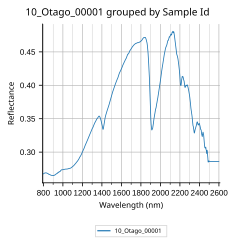

In [9]:
ax = matcol.plot_profiles(stacked=False, scope='10_Otago_00001', groupby='Sample ID')

Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/10_otago_by_sample id_profile_plot.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/10_otago_by_sample id_profile_plot.svg


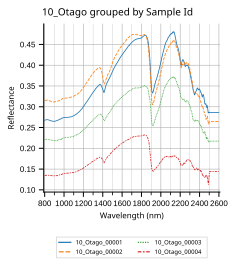

In [10]:
ax = matcol.plot_profiles(stacked=False, scope='10_otago', groupby='Sample ID')

Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_3of3.svg


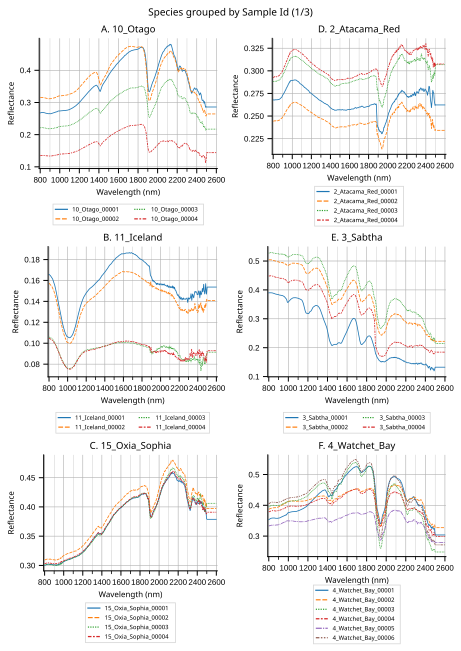

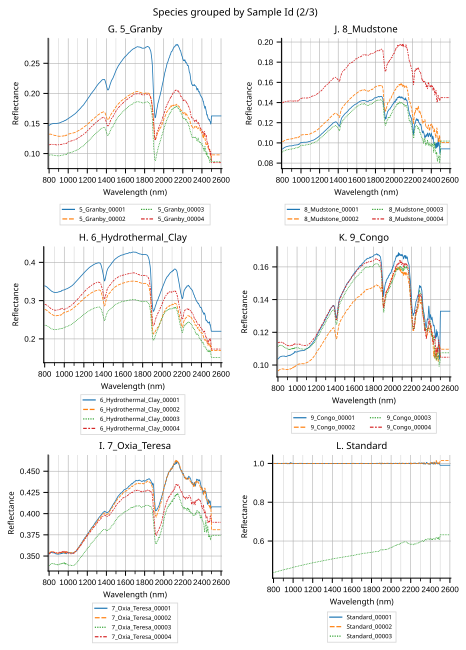

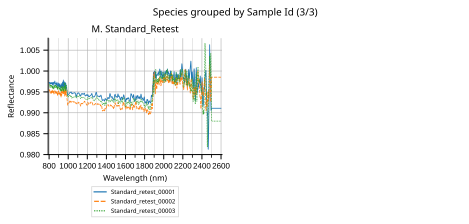

In [11]:
ax = matcol.plot_profiles(stacked=False, scope='species', groupby='Sample ID')

**Figure 4** High resolution MICA Files spectral library, arranged by category and grouped by mineral species.

### Continuum Removal

In [12]:
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

matcol_sla = sla(matcol)
matcol_cr = matcol_sla.remove_continuum()

We can plot the profiles to illustrate the continuum removal.

Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_stacked_continuum_removed_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_stacked_continuum_removed_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_stacked_continuum_removed_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_stacked_continuum_removed_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_stacked_continuum_removed_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_profile_plot_stacked_continuum_removed_3of3.svg


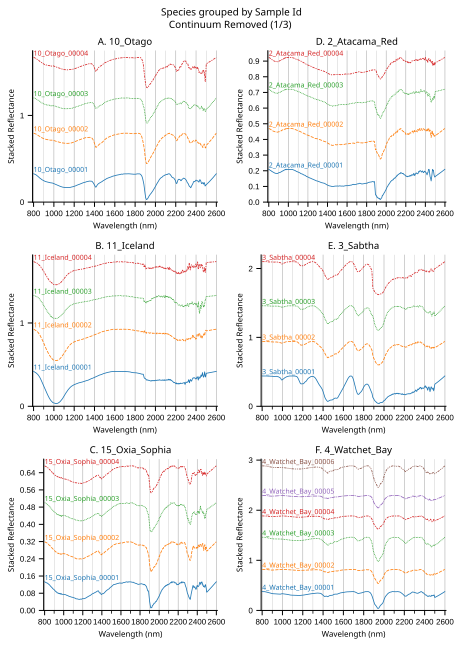

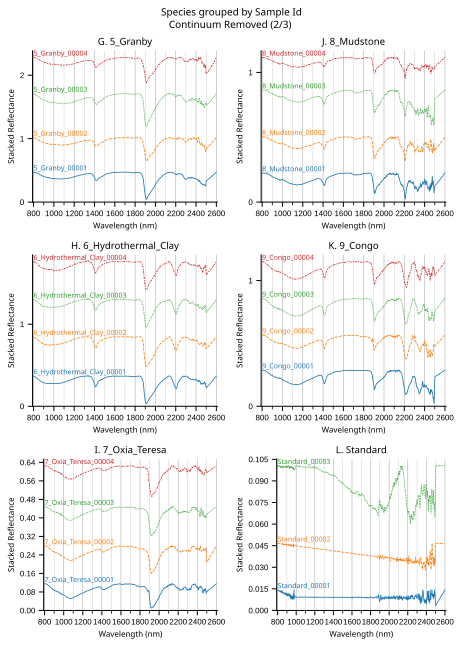

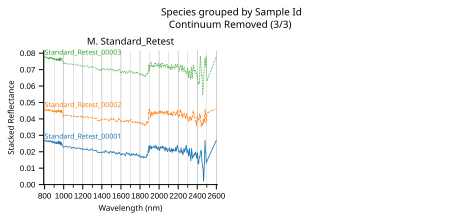

In [13]:
axes = matcol_cr.plot_profiles(stacked=True, scope='species', groupby='Sample ID')

**Figure 5** Continuum-removed high resolution MICA Files spectral library, grouped by Category.

We can illustrate the band locations more clearly with the 'waterfall' visualisation:

Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/all_entries_by_species_waterfall_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/all_entries_by_species_waterfall_continuum_removed.svg


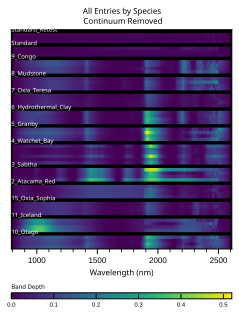

In [14]:
axes = matcol_cr.plot_profiles(waterfall=True, scope='all', groupby='Species')

Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_waterfall_continuum_removed_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_waterfall_continuum_removed_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_waterfall_continuum_removed_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_waterfall_continuum_removed_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_waterfall_continuum_removed_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/species_by_sample id_waterfall_continuum_removed_3of3.svg


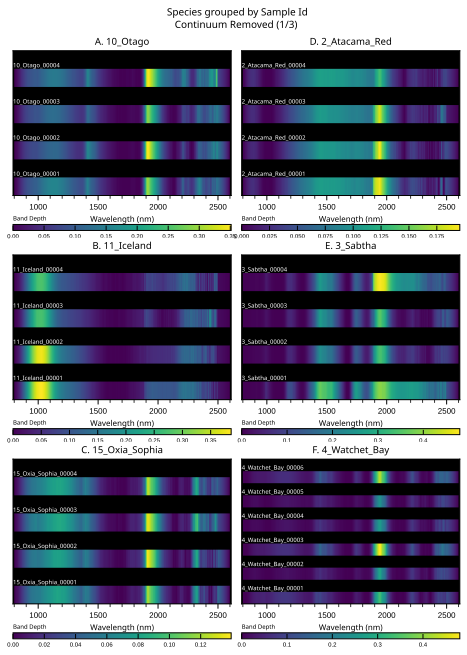

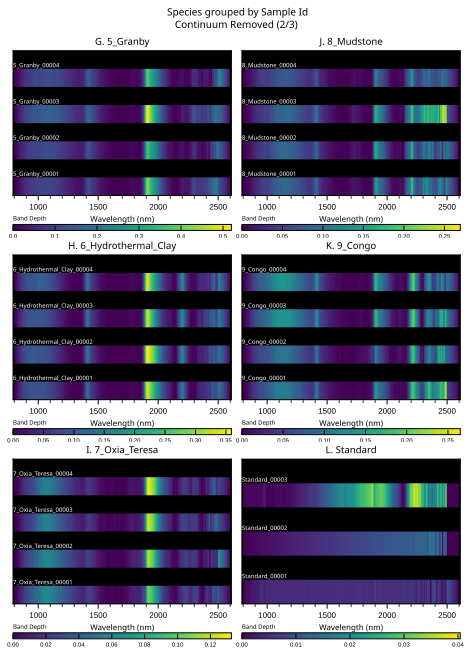

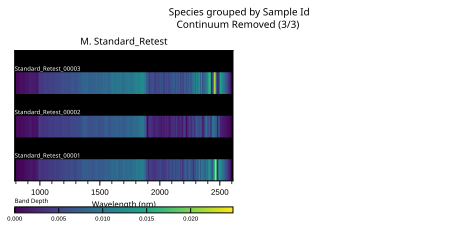

In [15]:
axes = matcol_cr.plot_profiles(waterfall=True, scope='species', groupby='Sample ID')

**Figure 6** Continuum-removed waterfall plot of high resolution MICA Files spectral library, grouped by Category.

We can see that the waterfall plot represents the band depth information of the `MaterialCollection` in a compact format. Scanning vertically allows for quick identification of common band locations, their depths, widths, and asymmetries.

## Simulating the Enfys Spectral Response

In [16]:
from sptk.instrument import Instrument

In [17]:
enfys = Instrument(
            name = 'enfys_ingaas_mwir', # filename of the instrument information, held in /software/data/instruments/            
            project_name = matcol.project_name, # the project directory name, hosting outputs in the /spectral_parameter_studies/ directory
            shape = 'cauchy',
            load_existing=False, # if True, load existing instrument data from the project directory
            plot_profiles=False, # if true, plot the transmission profiles during construction
            export_df=True) # if True, export the instrument transmission profiles to the project directory

Building Instrument...
Building new DataFrame for 'enfys_ingaas_mwir'...
Exporting the Instrument to CSV and Pickle formats...


Plotting Instrument Transmission...


/opt/homebrew/Caskroom/miniconda/base/envs/enfys_mission_reference_samples/lib/python3.10/site-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


Plots exported to ../projects/enfys_mrs_analysis_demo/instrument


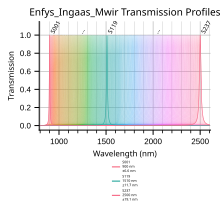

In [18]:
fig ,ax = enfys.plot_filter_profiles()

Plotting Instrument Transmission...
Plots exported to ../projects/enfys_mrs_analysis_demo/instrument


/opt/homebrew/Caskroom/miniconda/base/envs/enfys_mission_reference_samples/lib/python3.10/site-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


(1400.0, 1600.0)

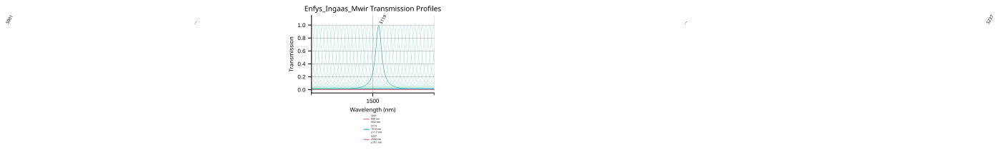

In [19]:
fig ,ax = enfys.plot_filter_profiles()
ax.set_xlim(1400, 1600)

Plotting Instrument Transmission...


/opt/homebrew/Caskroom/miniconda/base/envs/enfys_mission_reference_samples/lib/python3.10/site-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


Plotting Maximum Signal-to-Noise Ratio...
Plotting FWHM...
Plotting Spectral Resolution...
Plots exported to ../projects/enfys_mrs_analysis_demo/instrument


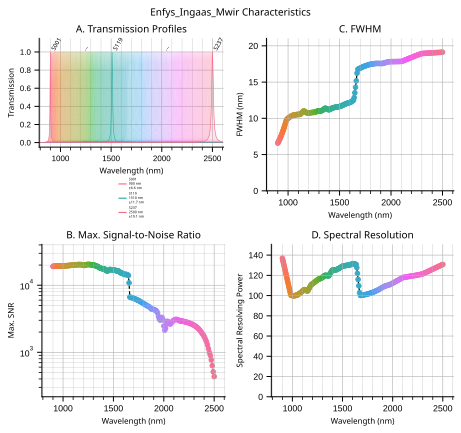

In [20]:
fig ,ax = enfys.plot_instrument_characteristics()

In [21]:
enfys.cwls()

filter_id
S001     900.000000
S002     903.285743
S003     906.618278
S004     909.999291
S005     913.430570
           ...     
S233    2462.191283
S234    2471.733576
S235    2481.279884
S236    2490.830182
S237    2500.384445
Name: cwl, Length: 237, dtype: float64

In [22]:
enfys.fwhms()['S119']

11.6687420228

**Figure 9** Simulated spectral response and resolution of *Enfys*, based on preliminary expectations of the spectral and radiometric response.

The data shown in figure 9 approximates the expected performance of *Enfys*. This data represents the current component level understanding of the filter and sensor performance of the built instrument.

# Results

## Sampling with Enfys

We now make an ```Observation``` object by sampling the MICA files ```MaterialCollection``` with the Enfys ```Instrument```.

In [23]:
from sptk.observation import Observation

In [24]:
obs = Observation(
    material_collection=matcol,
    instrument = enfys,
    load_existing=False,
    plot_profiles=False,
    export_df=True)

Building new Observation DataFrame                                                  for 'enfys_mrs_analysis_demo'...
Sampling the Material Collection with the Instrument...
Sampling complete.
Exporting the Observation Pickle format...
Observation export complete.


We can plot the sampled spectra against the input high-spectra below:

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_3of3.svg


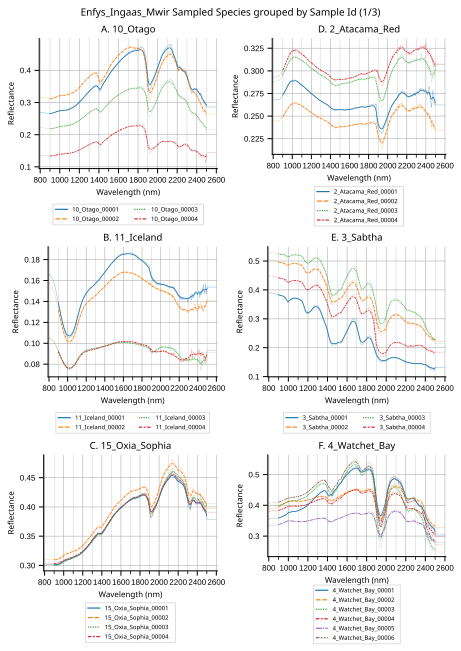

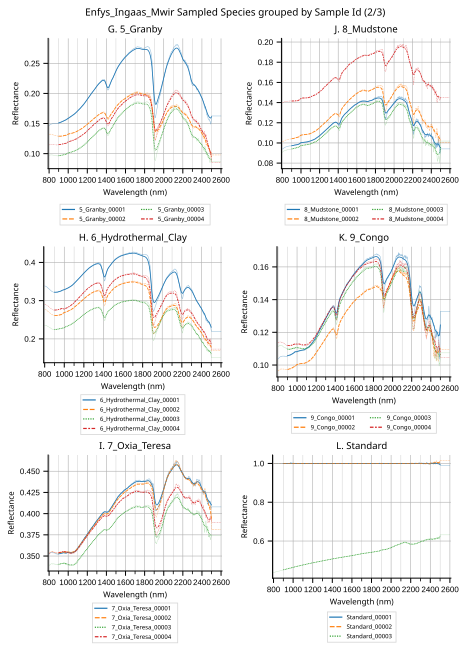

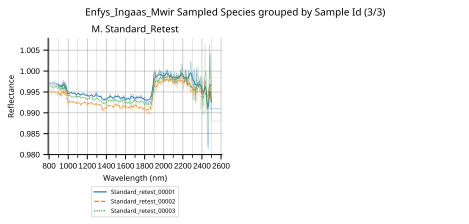

In [25]:
# axes = obs.plot_profiles(scope='categories', groupby='Subgroup', stacked=True, hires_under=True)

axes = obs.plot_profiles(stacked=False, scope='species', groupby='Sample ID', hires_under=True)

**Figure 10** The MICA files as sampled by *Enfys*, with the original high-resolution spectra plotted underneath each.

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot.svg


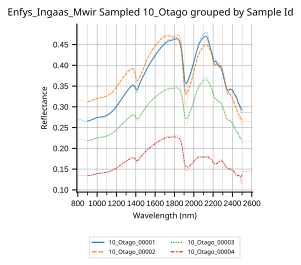

In [26]:
axes = obs.plot_profiles(scope='10_Otago', groupby='Sample ID', stacked=False, hires_under=True)

**Figure 11** Deviation of the *Enfys* sampled spectrum from the high-resolution input spectrum for Illite.

We note that there is an effect by which peaks and troughs in the spectra are reduced. This is due to the long tails of the Cauchy filter profiles. Despite the reduction of absolute band depth, the features of Illite (fig. 8) are still resolvable.

We can produce a continuum-removed waterfall plot to check that the major bands are resolved.

In [27]:
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

obs_cr = sla(obs).remove_continuum()

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_species_waterfall_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_species_waterfall_continuum_removed.svg


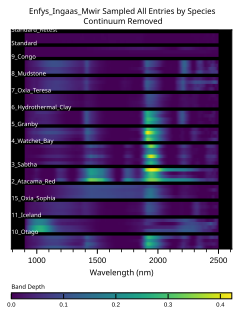

In [28]:
axes = obs_cr.plot_profiles(waterfall=True, scope='all', groupby='Species')

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_3of3.svg


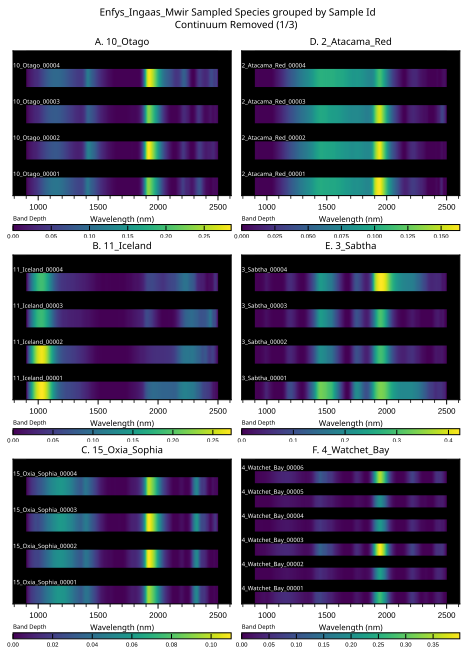

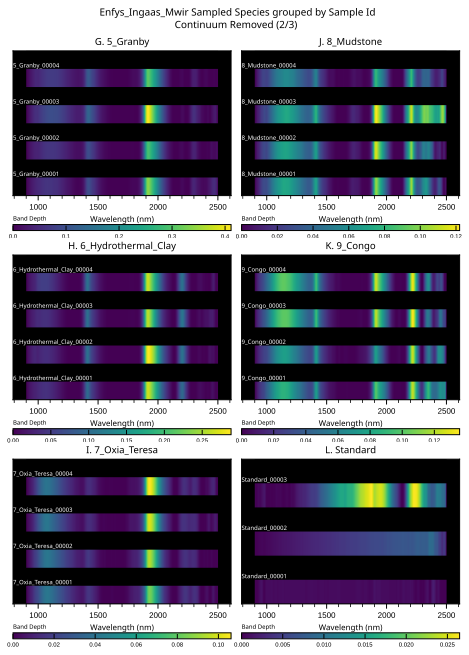

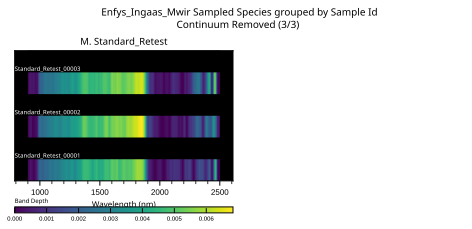

In [29]:
# axes = obs_cr.plot_profiles(waterfall=True, scope='all', groupby='Category')

axes = obs_cr.plot_profiles(waterfall=True, scope='species', groupby='Sample ID')

**Figure 12** Continuum-Removed waterfall plot of the MICA files as sampled by *Enfys*.

Comparing Figure 12 to Figure 6, we can see that the weaker sub-2 µm bands are less well resolved.

We can save this data

In [30]:
obs_cr.export_main_df()

Exporting the Observation Pickle format...
Observation export complete.


## Adding Synthetic Noise

First, let's draw a single noisy entry:

In [31]:
noise_obs = obs.add_noise(1, seed=0)

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_with_noise.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_with_noise.svg


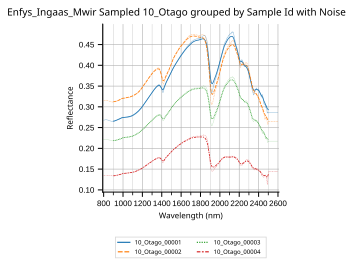

In [32]:
axes = obs.plot_profiles(scope='10_Otago', groupby='Sample ID', stacked=False, hires_under=True, ci=False)

**Figure 13** Noisy resampled example spectrum for Illite, showing 1 noisy sample according to the spectral signal-to-noise ratio illustrated in figure 9.B.

We can illustrate this in greater deal by plotting each entry on a separate figure, with the y-axis clipped to the spectral range of entry. Note that for samples with a small spectral range (i.e. samples that are spectrally flat), this stretching will appear to amplify noise, so the y-axis range must be considered when assessing the noise.

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_samples_by_species_profile_plot_with_noise_1of9.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_samples_by_species_profile_plot_with_noise_1of9.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_samples_by_species_profile_plot_with_noise_2of9.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_samples_by_species_profile_plot_with_noise_2of9.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_samples_by_species_profile_plot_with_noise_3of9.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_samples_by_species_profile_plot_with_noise_3of9.svg
Profile plot exported to ../projects/enfys_mrs_analysis_de

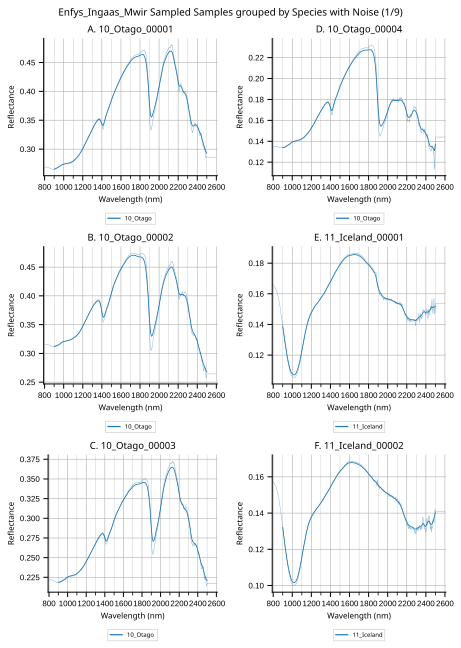

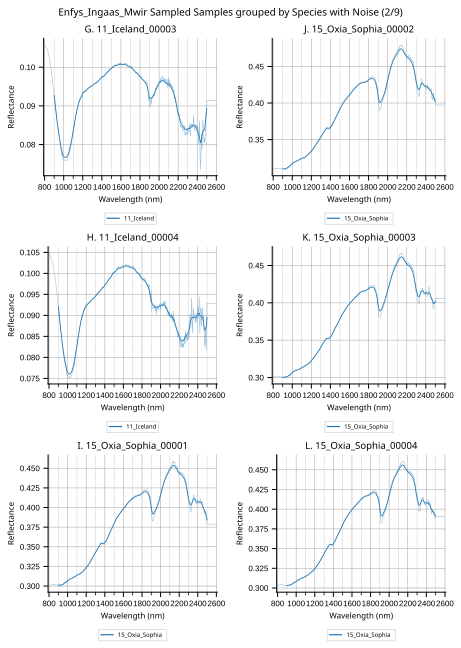

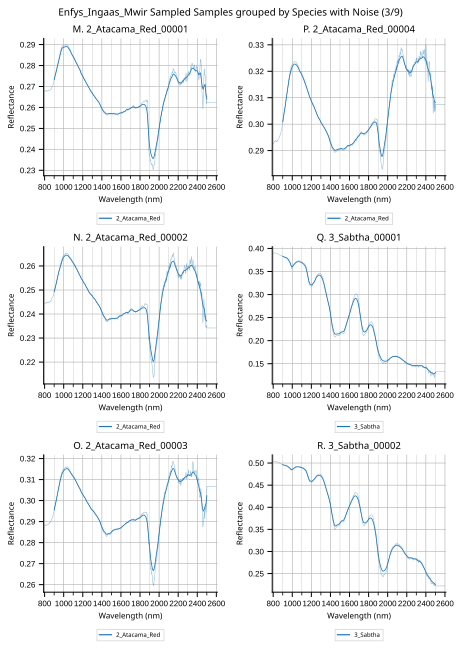

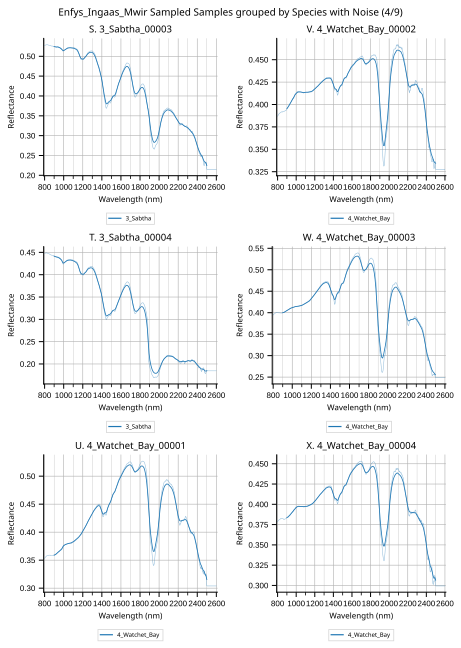

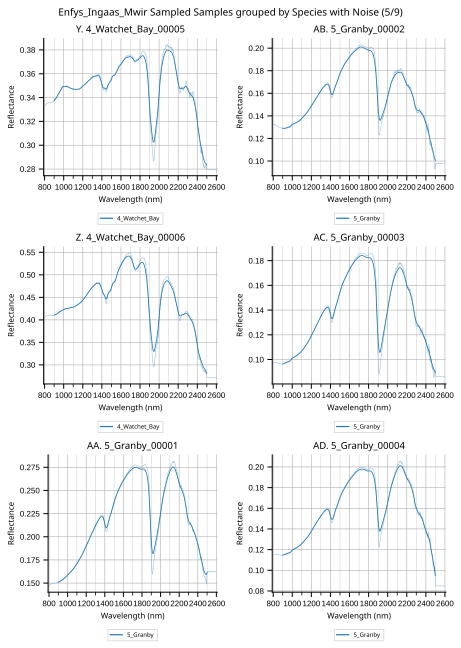

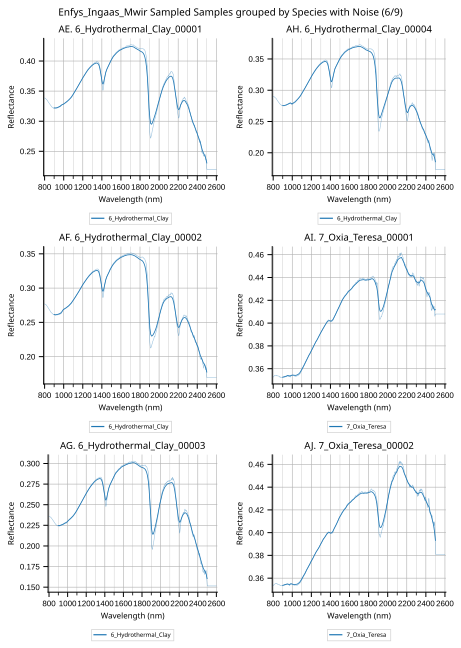

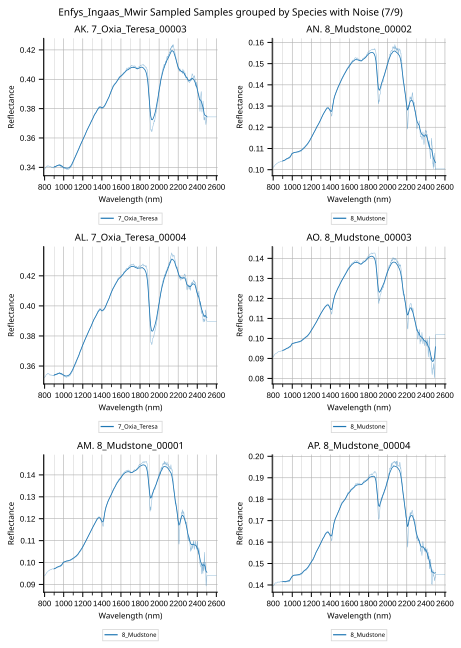

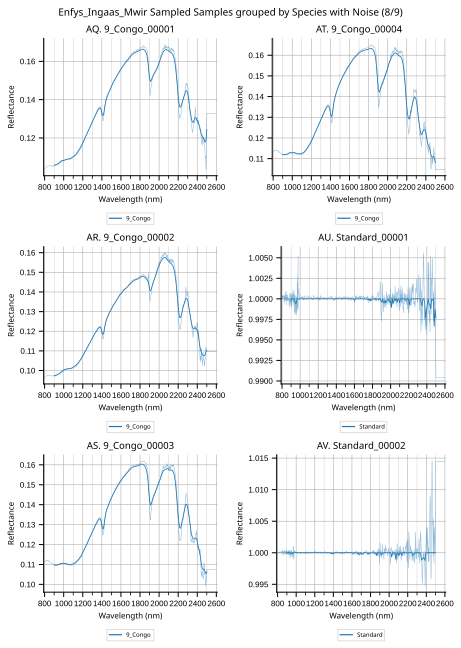

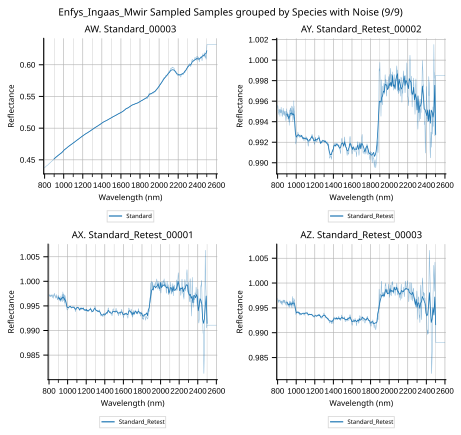

In [33]:
axes = obs.plot_profiles(scope='samples', groupby='Species', stacked=False, hires_under=True, ci=False)

**Figure 14** Detailled view of each entry in the spectral library, showing the scale of noise introduced, relative to the features of each spectrum, and the reflectance range.

Qualitatively, these plots illustrate that *Enfys* does not significantly intrude on the diagnostic features of these type specimen of minerals identified on the Mars surface. In some cases, we can see that doublet features are lost, but this is due to the spectral resolving power, rather than the additive noise. We will assess this in the discussion section.

We can export the dataset:

In [34]:
obs.export_main_df()

Exporting the Observation Pickle format...
Observation export complete.


We can also show the collected spectra as before:

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_sample id_profile_plot_stacked_with_noise.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_sample id_profile_plot_stacked_with_noise.svg


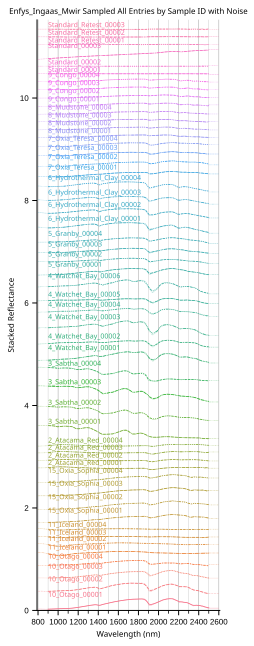

In [35]:
axes = obs.plot_profiles(stacked=True, scope='all', groupby='Sample ID', hires_under=True)

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_with_noise_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_with_noise_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_with_noise_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_with_noise_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_with_noise_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_with_noise_3of3.sv

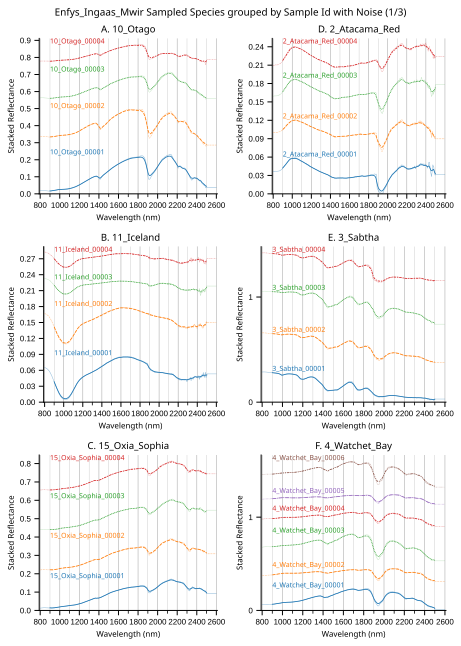

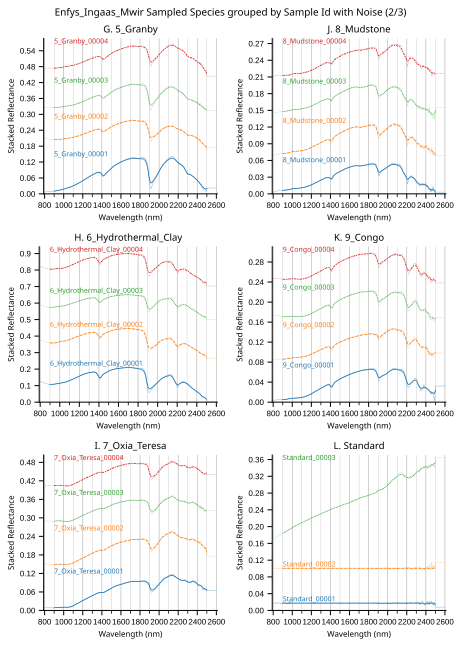

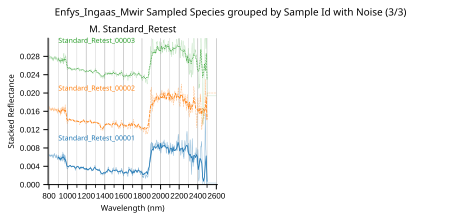

In [36]:
axes = obs.plot_profiles(stacked=True, scope='species', groupby='Sample ID', hires_under=True)

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_with_noise_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_with_noise_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_with_noise_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_with_noise_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_with_noise_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_with_noise_3of3.svg


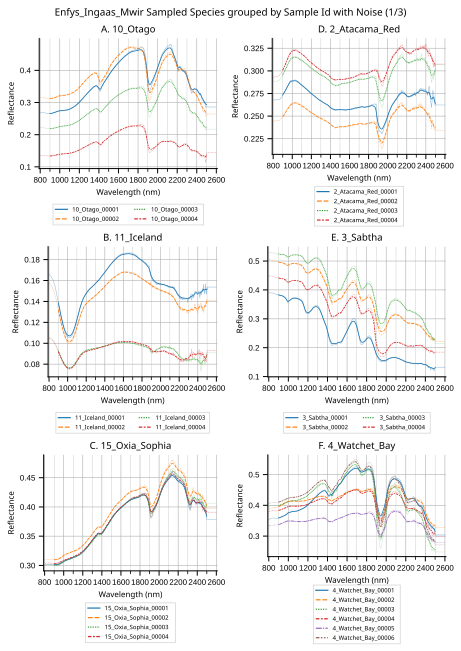

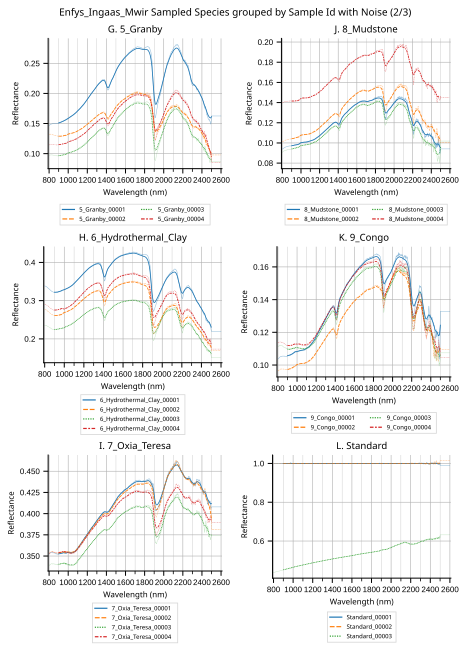

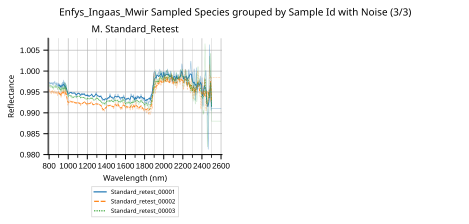

In [37]:
axes = obs.plot_profiles(stacked=False, scope='species', groupby='Sample ID', hires_under=True)

## Continuum Removal

We can apply continuum removal, even to the noisy data.

In [38]:
from sptk.spectral_library_analyser import SpectralLibraryAnalyser as sla

cr_tool = sla(obs)
cr_obs = cr_tool.remove_continuum()

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_continuum_removed_with_noise_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_continuum_removed_with_noise_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_continuum_removed_with_noise_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_continuum_removed_with_noise_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_profile_plot_stacked_continuum_removed_with_noise_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/pl

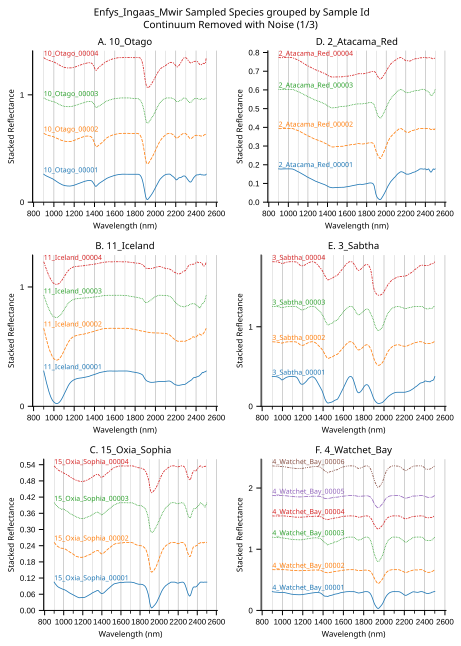

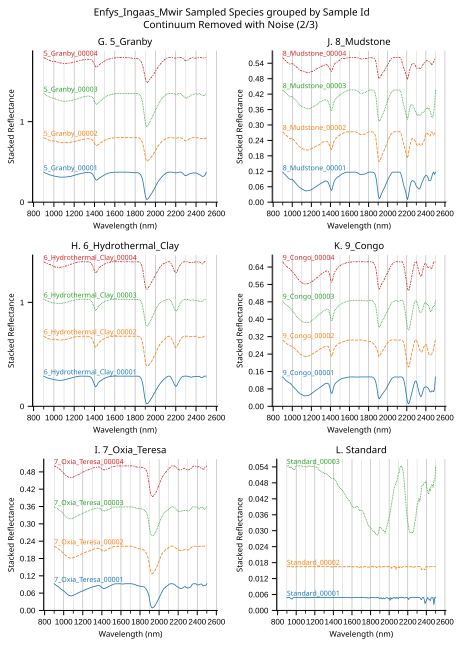

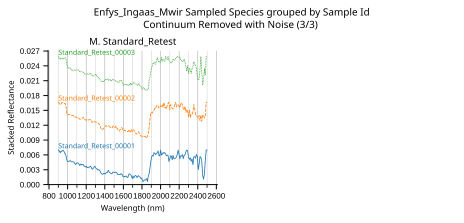

In [39]:
axes = cr_obs.plot_profiles(scope='species', groupby='Sample ID', stacked=True, hires_under=False, ci=False)

**Figure 15** Continuum-Removed entries of the MICA Files, as sampled by *Enfys*, including synthetic noise.

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_species_waterfall_continuum_removed_with_noise.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_species_waterfall_continuum_removed_with_noise.svg


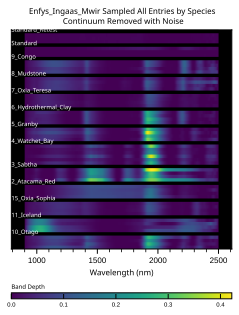

In [40]:
axes = cr_obs.plot_profiles(waterfall=True, scope='all', groupby='Species')

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_with_noise_1of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_with_noise_1of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_with_noise_2of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_with_noise_2of3.svg
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_waterfall_continuum_removed_with_noise_3of3.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_species_by_sample id_wate

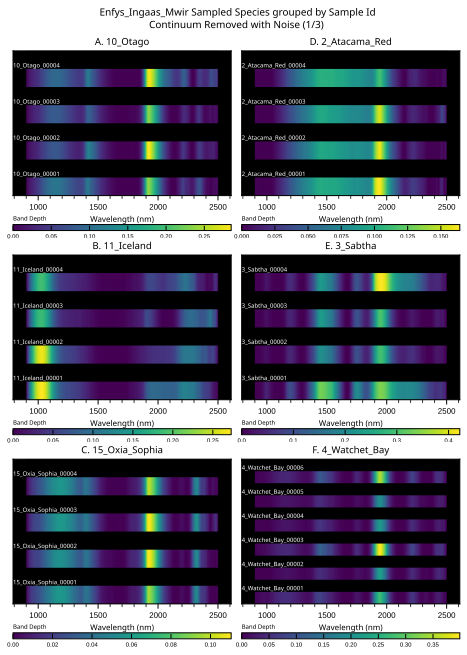

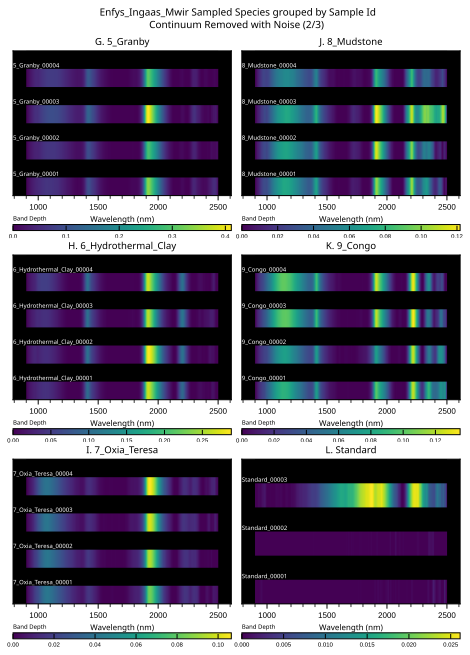

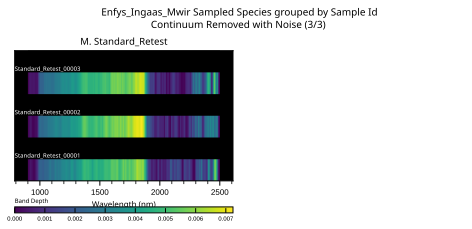

In [41]:
axes = cr_obs.plot_profiles(waterfall=True, scope='species', groupby='Sample ID')

Again, we can export this:

In [42]:
cr_obs.export_main_df()

Exporting the Observation Pickle format...
Observation export complete.


# Sample Analysis

In this section we look at each sample set in turn.

## 8. Proterozoic Mudstone with Microfossils (Mauritania)

First we access the Mauritania samples

![#8 Mauritania - Context Image](../context_images/8_proterozoic_mudstone.jpg)

**#8 Mauritania - Context Image**

![#8 Mauritania - Spectrometer Sample Point](../context_images/8_proterozoic_mudstone_spot.jpeg)

**#8 Mauritania - Spectrometer Sample Point**

In [43]:
obs.get_subset_df(category='samples').Group.unique()

array(['10_Otago', '11_Iceland', '15_Oxia_Sophia', '2_Atacama_Red',
       '3_Sabtha', '4_Watchet_Bay', '5_Granby', '6_Hydrothermal_Clay',
       '7_Oxia_Teresa', '8_Mudstone', '9_Congo'], dtype=object)

In [44]:
sample = '10_Otago'

In [45]:
obs.get_subset_df(group=sample)

,Category,Root Data ID,Sample ID,Species,Subgroup,Group,Library,Sample Description,Date Added,Viewing Geometry,...,2414.54097557,2424.0627937,2433.58876046,2443.11884877,2452.65303176,2462.19128285,2471.73357568,2481.27988414,2490.83018234,2500.38444467
Data ID,,,,,,,,,,,,,,,,,,,,,
10_Otago_00001 10_otago.,samples,10_Otago_00001 10_otago,10_Otago_00001,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.333492,0.329255,0.326353,0.322359,0.315375,0.310690,0.305161,0.300566,0.295226,0.293057
10_Otago_00002 10_otago.,samples,10_Otago_00002 10_otago,10_Otago_00002,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.311835,0.305999,0.300607,0.294252,0.288338,0.282578,0.278178,0.275053,0.270358,0.267566
10_Otago_00003 10_otago.,samples,10_Otago_00003 10_otago,10_Otago_00003,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.253377,0.248605,0.243867,0.239983,0.238418,0.233855,0.228810,0.225732,0.222455,0.220490
10_Otago_00004 10_otago.,samples,10_Otago_00004 10_otago,10_Otago_00004,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.144534,0.141633,0.138299,0.135873,0.134958,0.134740,0.134198,0.132281,0.130983,0.137317


First let's plot the reflectance data without stacking.

Let's make the plots a bit bigger

In [47]:
CM = 1/2.54 
orig_fig_size = cfg.FIG_SIZE
cfg.FIG_SIZE = (8*CM, 7.5*CM) 
cfg.FIG_SIZE = (1.9*cfg.FIG_SIZE[0], 1.25*cfg.FIG_SIZE[1])

Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/10_Otago_by_sample id_profile_plot.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/material_collection/plots/10_Otago_by_sample id_profile_plot.svg


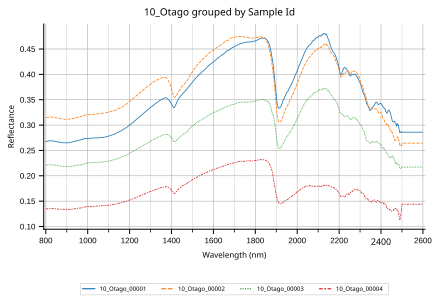

In [48]:
axes = matcol.plot_profiles(scope=sample, groupby='Sample ID', stacked=False, ci=False)

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_with_noise.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_with_noise.svg


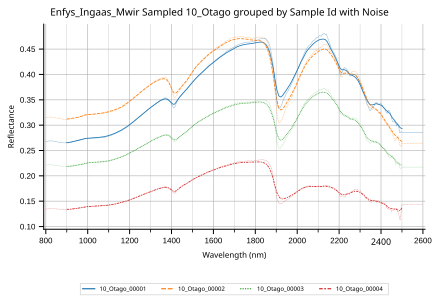

In [49]:
axes = obs.plot_profiles(scope=sample, groupby='Sample ID', stacked=False, hires_under=True, ci=False)

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_with_noise.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_with_noise.svg


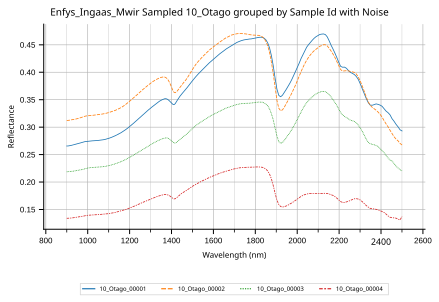

In [50]:
axes = obs.plot_profiles(scope=sample, groupby='Sample ID', stacked=False, hires_under=False, ci=False)

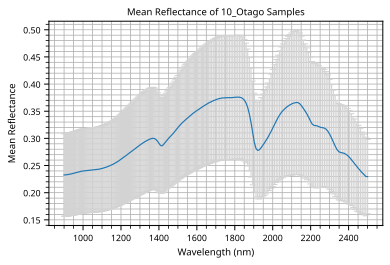

In [51]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=cfg.FIG_SIZE)
obs.get_refl_df(group=sample).mean().plot(yerr=obs.get_refl_df(group=sample).std(), ax=ax, capsize=3, ecolor='lightgray')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Mean Reflectance')
plt.minorticks_on()
plt.grid(which='both')
title = plt.title(f'Mean Reflectance of {sample} Samples')

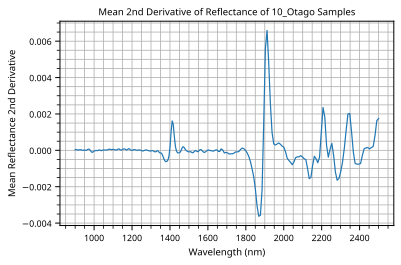

In [52]:
import numpy as np

# take the 2st derivative of the reflectance profiles for the sample
fig, ax = plt.subplots(figsize=cfg.FIG_SIZE)
plt.plot(obs.wvls, np.gradient(np.gradient(obs.get_refl_df(group=sample).mean())))
# plt.ylim(-0.001,0.001)
plt.xlabel('Wavelength (nm)')
plt.ylabel('Mean Reflectance 2nd Derivative')
title = plt.title(f'Mean 2nd Derivative of Reflectance of {sample} Samples')
# set minor ticks every 10 nm
plt.minorticks_on()
plt.grid(which='both')

Now let's look at it stacked:

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_stacked_with_noise.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_stacked_with_noise.svg


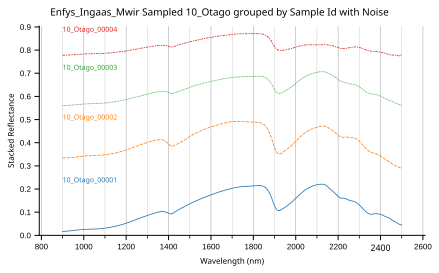

In [53]:
axes = obs.plot_profiles(scope=sample, groupby='Sample ID', stacked=True, hires_under=False, ci=False)

Now let's look at the continuum removed data.

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_continuum_removed.svg


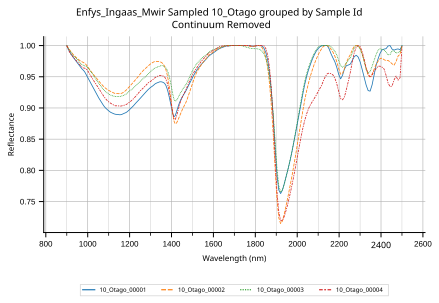

In [54]:
axes = obs_cr.plot_profiles(scope=sample, groupby='Sample ID', stacked=False, hires_under=False, ci=False)

Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_stacked_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mrs_analysis_demo/observation/plots/enfys_ingaas_mwir_sampled_10_Otago_by_sample id_profile_plot_stacked_continuum_removed.svg


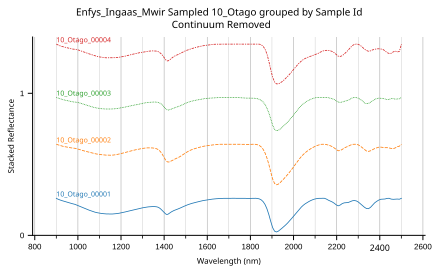

In [55]:
axes = obs_cr.plot_profiles(scope=sample, groupby='Sample ID', stacked=True, hires_under=False, ci=False)

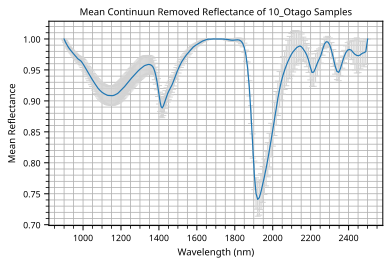

In [56]:
fig, ax = plt.subplots(figsize=cfg.FIG_SIZE)
obs_cr.get_refl_df(group=sample).mean().plot(yerr=obs_cr.get_refl_df(group=sample).std(), ax=ax, capsize=3, ecolor='lightgray')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Mean Reflectance')
plt.minorticks_on()
plt.grid(which='both')
title = plt.title(f'Mean Continuun Removed Reflectance of {sample} Samples')

We see a broad and deep absorption centred ~1.1 µm, and narrow and shallow absorption at ~1.43 µm, and a deep and assymetric absorption at ~1.92 µm. there is another absorption at ~2.30 µm.

# Comparison to MICA Files

In [57]:
cfg.FIG_SIZE = orig_fig_size

In [58]:
PROJECT_NAME = 'enfys_mica'

In [59]:
from sptk.material_sets import MICA_SET

mica_mc = MaterialCollection(
        MICA_SET,
        'MICA_new_dirtree', 
        PROJECT_NAME, 
        load_existing=False,
        balance_classes=False,
        random_bias_seed=None,
        allow_out_of_bounds=True,
        plot_profiles=False,
        export_df=True)

Building new enfys_mica MaterialCollection DF

---------------------------------
Category
└──species|subgroup|group|
   └──data_id status
---------------------------------
Iron Oxides & Primary Silicates
└──-clinopyroxene|pyroxenes|inosilicates|
   └──-NBPP22.csv loaded
└──-orthopyroxene|pyroxenes|inosilicates|
   └──-LAPP47B.csv loaded
└──-fayalite|olivines|nesosilicates|
   └──-LAPO05.csv loaded
└──-forsterite|olivines|nesosilicates|
   └──-LASC02.csv loaded
└──-hematite|hematites|oxides|
   └──-GDS27.csv loaded
└──-plagioclase|feldspars|tectosilicates|
   └──-NCLS04.csv loaded
---------------------------------
Sulfates
└──-alunite|hydrous_sulphates|sulphates|
   └──-F1CC08B.csv loaded
└──-bassanite|hydrous_sulphates|sulphates|
   └──-GDS145.csv loaded
└──-gypsum|hydrous_sulphates|sulphates|
   └──-LASF41A.csv loaded
└──-jarosite|hydrous_sulphates|sulphates|
   └──-LASF21A.csv loaded
└──-kieserite|hydrous_sulphates|sulphates|
   └──-F1CC15.csv loaded
└──-mg-sulphate|hydrous_sulphates

In [75]:
enfys.project_name = PROJECT_NAME

In [76]:
mica_ob = Observation(
    material_collection=mica_mc,
    instrument = enfys,
    load_existing=False,
    plot_profiles=False,
    export_df=True)

Building new Observation DataFrame                                                  for 'enfys_mica'...
Sampling the Material Collection with the Instrument...
Sampling complete.
Exporting the Observation Pickle format...
Observation export complete.


In [77]:
mica_ob.main_df

,Category,Sample ID,Species,Subgroup,Group,Library,Sample Description,Date Added,Viewing Geometry,Other Information,...,2414.54097557,2424.0627937,2433.58876046,2443.11884877,2452.65303176,2462.19128285,2471.73357568,2481.27988414,2490.83018234,2500.38444467
Data ID,,,,,,,,,,,,,,,,,,,,,
CAGR01 Calcite,carbonates,CAGR01,calcite,calcites,carbonates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.839881,0.835295,0.828742,0.820196,0.809644,0.796689,0.782006,0.767985,0.756779,0.747834
F1CC06B Magnesite,carbonates,F1CC06B,magnesite,calcites,carbonates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.566400,0.552773,0.538133,0.523393,0.510118,0.499338,0.490870,0.484044,0.478724,0.476424
HS433 Halite,hydrated silicates & halides,HS433,halite,chlorides,halides,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.892896,0.891431,0.889516,0.887710,0.886255,0.885046,0.884112,0.883357,0.882525,0.881304
LAZE03 Prehnite,hydrated silicates & halides,LAZE03,prehnite,prehnites,inosilicates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.549730,0.567813,0.581874,0.589612,0.589080,0.582723,0.574704,0.570042,0.568654,0.565474
bkr1jb329c Siliceous-sinter,hydrated silicates & halides,bkr1jb329c,siliceous-sinter,hydrated-silicas,mineraloids,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.248280,0.240092,0.231782,0.223611,0.215853,0.208689,0.202230,0.196535,0.191543,0.187157
GDS26 Epidote,hydrated silicates & halides,GDS26,epidote,epidotes,sorosilicates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.537622,0.548505,0.553707,0.554590,0.551703,0.546222,0.537993,0.527678,0.516754,0.506379
GDS1 Analcime,hydrated silicates & halides,GDS1,analcime,zeolites,tectosilicates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.465713,0.433150,0.399871,0.367576,0.337315,0.309672,0.286693,0.268127,0.252550,0.240689
NBPP22 Clinopyroxene,iron oxides & primary silicates,NBPP22,clinopyroxene,pyroxenes,inosilicates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.325781,0.329127,0.332636,0.336521,0.340549,0.344291,0.348258,0.352554,0.357202,0.361846
LAPP47B Orthopyroxene,iron oxides & primary silicates,LAPP47B,orthopyroxene,pyroxenes,inosilicates,MICA_new_dirtree,NaN,NaN,NaN,NaN,...,0.539619,0.542085,0.543895,0.545490,0.546830,0.548127,0.549674,0.551384,0.552740,0.553800


In [78]:
obs.main_df

,Category,Root Data ID,Sample ID,Species,Subgroup,Group,Library,Sample Description,Date Added,Viewing Geometry,...,2414.54097557,2424.0627937,2433.58876046,2443.11884877,2452.65303176,2462.19128285,2471.73357568,2481.27988414,2490.83018234,2500.38444467
Data ID,,,,,,,,,,,,,,,,,,,,,
10_Otago_00001 10_otago.,samples,10_Otago_00001 10_otago,10_Otago_00001,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.333492,0.329255,0.326353,0.322359,0.315375,0.310690,0.305161,0.300566,0.295226,0.293057
10_Otago_00002 10_otago.,samples,10_Otago_00002 10_otago,10_Otago_00002,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.311835,0.305999,0.300607,0.294252,0.288338,0.282578,0.278178,0.275053,0.270358,0.267566
10_Otago_00003 10_otago.,samples,10_Otago_00003 10_otago,10_Otago_00003,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.253377,0.248605,0.243867,0.239983,0.238418,0.233855,0.228810,0.225732,0.222455,0.220490
10_Otago_00004 10_otago.,samples,10_Otago_00004 10_otago,10_Otago_00004,10_otago,10_Otago,10_Otago,EXM_MRS,Sample 10,"02/20/2024,02/20/2024",NaN,...,0.144534,0.141633,0.138299,0.135873,0.134958,0.134740,0.134198,0.132281,0.130983,0.137317
11_Iceland_00001 11_iceland.,samples,11_Iceland_00001 11_iceland,11_Iceland_00001,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.148000,0.148138,0.148425,0.149458,0.150235,0.151562,0.150849,0.151474,0.151281,0.151849
11_Iceland_00002 11_iceland.,samples,11_Iceland_00002 11_iceland,11_Iceland_00002,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.134521,0.135306,0.135682,0.134494,0.133709,0.133783,0.135122,0.136331,0.138219,0.140241
11_Iceland_00003 11_iceland.,samples,11_Iceland_00003 11_iceland,11_Iceland_00003,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.082546,0.081892,0.080458,0.081177,0.082685,0.083640,0.083672,0.084490,0.086785,0.089349
11_Iceland_00004 11_iceland.,samples,11_Iceland_00004 11_iceland,11_Iceland_00004,11_iceland,11_Iceland,11_Iceland,EXM_MRS,Sample 11,"02/20/2024,02/20/2024",NaN,...,0.090528,0.089869,0.089850,0.089693,0.089402,0.088336,0.086547,0.086598,0.087183,0.089482
15_Oxia_Sophia_00001 15_oxia_sophia.,samples,15_Oxia_Sophia_00001 15_oxia_sophia,15_Oxia_Sophia_00001,15_oxia_sophia,15_Oxia_Sophia,15_Oxia_Sophia,EXM_MRS,Sample 15,"02/20/2024,02/20/2024",NaN,...,0.406949,0.406983,0.406608,0.404494,0.401982,0.398746,0.396198,0.392937,0.389232,0.384105


Let's select some candidates:

In [79]:
mica_ob.main_df.Group.unique()

array(['carbonates', 'halides', 'inosilicates', 'mineraloids',
       'sorosilicates', 'tectosilicates', 'nesosilicates', 'oxides',
       'phyllosilicates', 'sulphates'], dtype=object)

In [80]:
cr_tool = sla(mica_ob)
mica_ob_cr = cr_tool.remove_continuum()

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_category_profile_plot_stacked_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_category_profile_plot_stacked_continuum_removed.svg


(<Figure size 3779.53x7972.44 with 1 Axes>,
 [<AxesSubplot: title={'center': 'Enfys_Ingaas_Mwir Sampled All Entries by Category\n Continuum Removed'}, xlabel='Wavelength (nm)', ylabel='Stacked Reflectance'>])

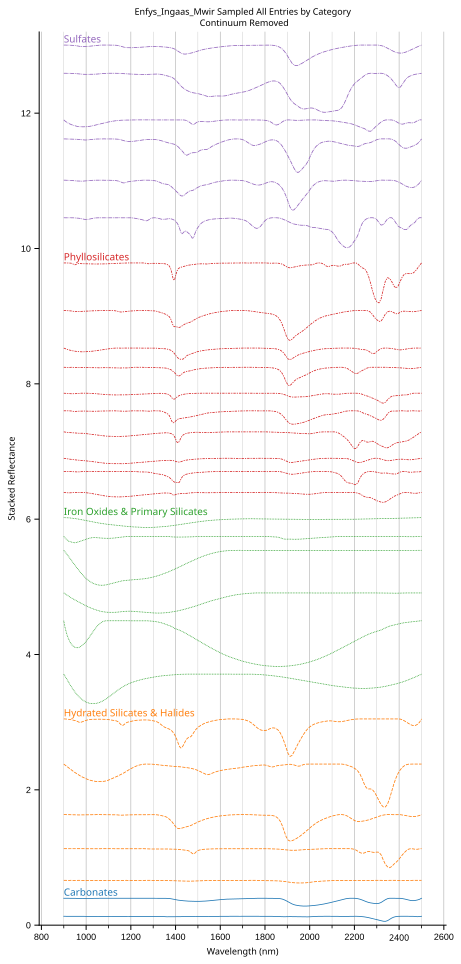

In [81]:
mica_ob_cr.plot_profiles(stacked=True)

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_category_waterfall_stacked_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_all_entries_by_category_waterfall_stacked_continuum_removed.svg


(<Figure size 3779.53x7972.44 with 2 Axes>,
 [<AxesSubplot: title={'center': 'Enfys_Ingaas_Mwir Sampled All Entries by Category\n Continuum Removed'}, xlabel='Wavelength (nm)'>])

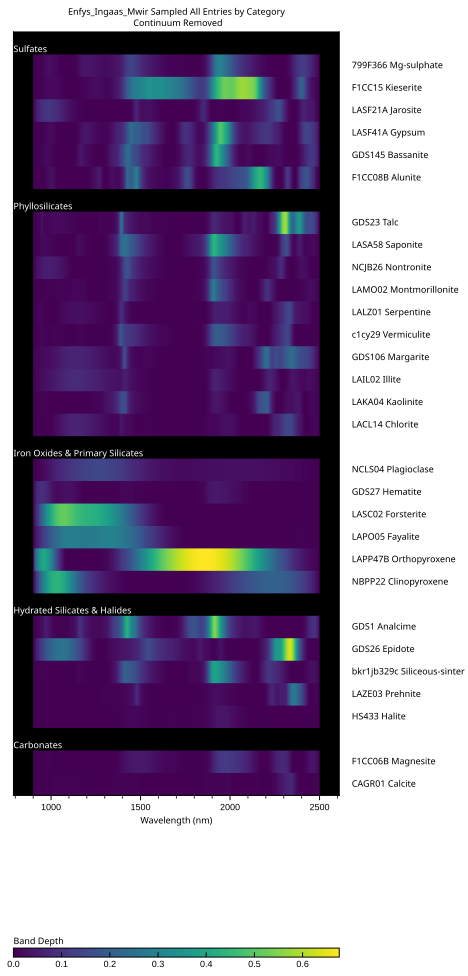

In [90]:
mica_ob_cr.plot_profiles(stacked=True, waterfall=True)

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_nesosilicates_by_species_profile_plot_stacked.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_nesosilicates_by_species_profile_plot_stacked.svg


[<AxesSubplot: xlabel='Wavelength (nm)', ylabel='Stacked Reflectance'>]

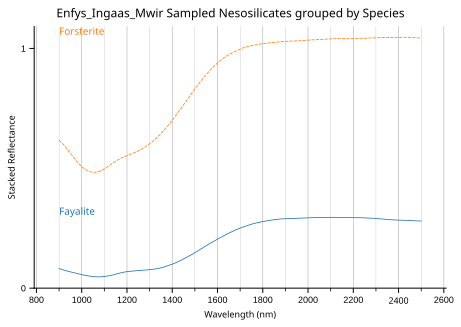

In [82]:
mica_ob.plot_profiles(scope='nesosilicates', groupby='Species', stacked=True, hires_under=False, ci=False)

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_nesosilicates_by_species_profile_plot_stacked_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_nesosilicates_by_species_profile_plot_stacked_continuum_removed.svg


[<AxesSubplot: xlabel='Wavelength (nm)', ylabel='Stacked Reflectance'>]

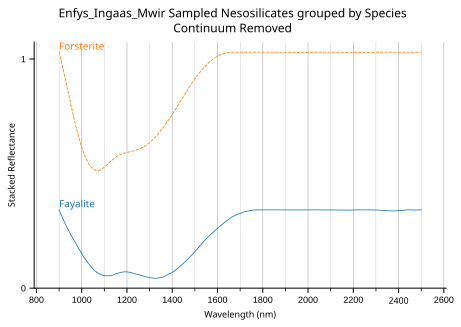

In [83]:
mica_ob_cr.plot_profiles(scope='nesosilicates', groupby='Species', stacked=True, hires_under=False, ci=False)

Olivine - Fayalite: Fe2SiO4

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_phyllosilicates_by_species_profile_plot_stacked.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_phyllosilicates_by_species_profile_plot_stacked.svg


[<AxesSubplot: xlabel='Wavelength (nm)', ylabel='Stacked Reflectance'>]

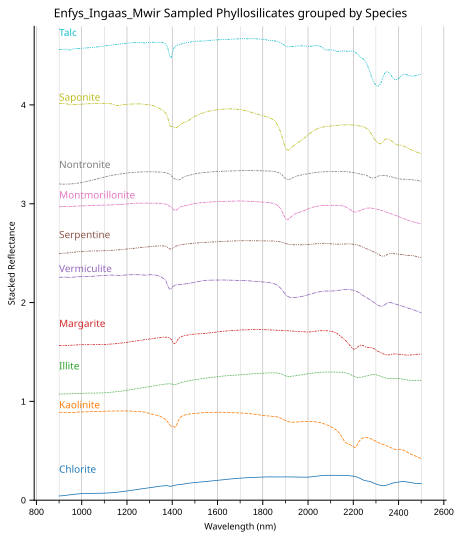

In [84]:
mica_ob.plot_profiles(scope='phyllosilicates', groupby='Species', stacked=True, hires_under=False, ci=False)

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_phyllosilicates_by_species_profile_plot_stacked_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_phyllosilicates_by_species_profile_plot_stacked_continuum_removed.svg


[<AxesSubplot: xlabel='Wavelength (nm)', ylabel='Stacked Reflectance'>]

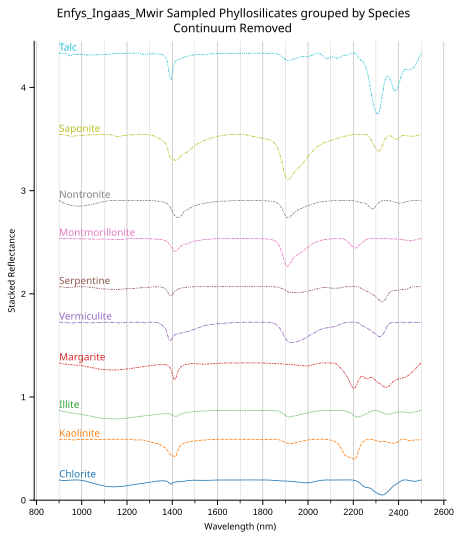

In [85]:
mica_ob_cr.plot_profiles(scope='phyllosilicates', groupby='Species', stacked=True, hires_under=False, ci=False)

In [86]:
cr_tool = sla(mica_mc)
mica_mc_cr = cr_tool.remove_continuum()

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_fayalite, analcime, montmorillonite, illite, alunite_by_species_profile_plot_stacked.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_fayalite, analcime, montmorillonite, illite, alunite_by_species_profile_plot_stacked.svg


[<AxesSubplot: xlabel='Wavelength (nm)', ylabel='Stacked Reflectance'>]

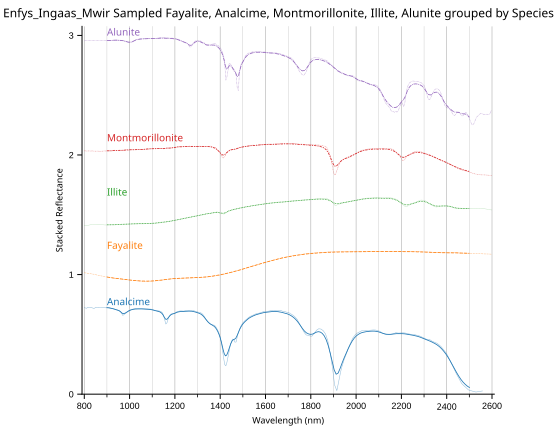

In [87]:
CM = 1/2.54 
cfg.FIG_SIZE = (8*CM, 7.5*CM) 
cfg.FIG_SIZE = (2*cfg.FIG_SIZE[0], 2*cfg.FIG_SIZE[1])
cfg.LABEL_S = 8
cfg.TITLE_S = 10
cfg.LEGEND_S = 6

cfg.LABEL_S = 9
cfg.TITLE_S = 12
cfg.LEGEND_S = 9

mica_ob.plot_profiles(scope=['fayalite','analcime', 'montmorillonite', 'illite', 'alunite'], groupby='Species', stacked=True, hires_under=True, ci=False)

Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_fayalite, analcime, montmorillonite, illite, alunite_by_species_profile_plot_stacked_continuum_removed.pdf
Profile plot exported to ../projects/enfys_mica/observation/plots/enfys_ingaas_mwir_sampled_fayalite, analcime, montmorillonite, illite, alunite_by_species_profile_plot_stacked_continuum_removed.svg


[<AxesSubplot: xlabel='Wavelength (nm)', ylabel='Stacked Reflectance'>]

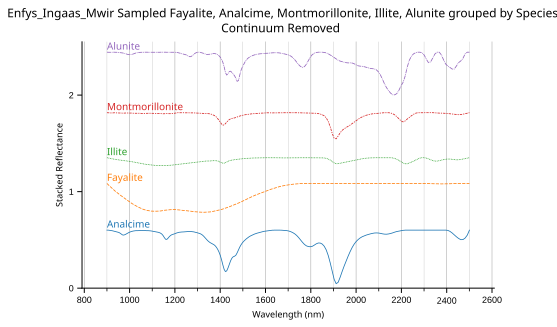

In [88]:
CM = 1/2.54 
cfg.FIG_SIZE = (8*CM, 7.5*CM) 
cfg.FIG_SIZE = (2*cfg.FIG_SIZE[0], 1.5*cfg.FIG_SIZE[1])
cfg.LABEL_S = 8
cfg.TITLE_S = 10
cfg.LEGEND_S = 6

cfg.LABEL_S = 9
cfg.TITLE_S = 12
cfg.LEGEND_S = 9

mica_ob_cr.plot_profiles(scope=['fayalite','analcime', 'montmorillonite', 'illite', 'alunite'], groupby='Species', stacked=True, ci=False)